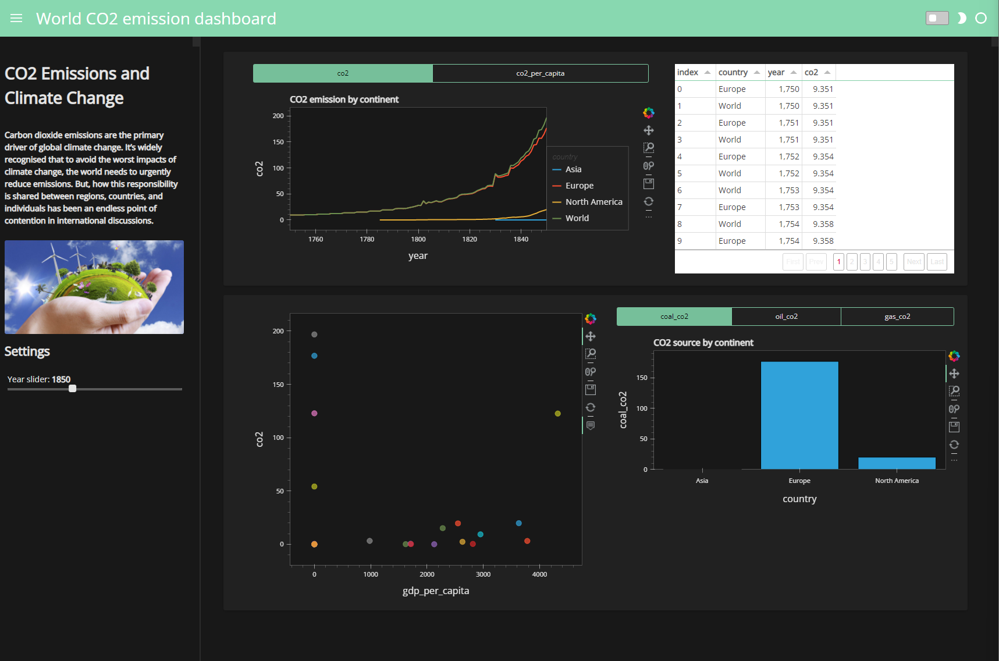

In [36]:
from IPython.display import Image
Image(filename='interactive_dashboard.png') 

This dahsboard was created using the code below

In [6]:
import pandas as pd
import numpy as np
import panel as pn
pn.extension('tabulator')

In [9]:
import hvplot.pandas

In [10]:
df = pd.read_csv("https://raw.githubusercontent.com/owid/co2-data/master/owid-co2-data.csv")

In [11]:
df[df['country'] == 'Finland']

,iso_code,country,year,co2,co2_per_capita,trade_co2,cement_co2,cement_co2_per_capita,coal_co2,coal_co2_per_capita,...,ghg_excluding_lucf_per_capita,methane,methane_per_capita,nitrous_oxide,nitrous_oxide_per_capita,population,gdp,primary_energy_consumption,energy_per_capita,energy_per_gdp
8407,FIN,Finland,1860,0.037,0.021,NaN,NaN,NaN,0.037,0.021,...,NaN,NaN,NaN,NaN,NaN,1731819.0,2.645236e+09,NaN,NaN,NaN
8408,FIN,Finland,1861,0.073,0.042,NaN,NaN,NaN,0.073,0.042,...,NaN,NaN,NaN,NaN,NaN,1737255.0,2.678358e+09,NaN,NaN,NaN
8409,FIN,Finland,1862,0.073,0.042,NaN,NaN,NaN,0.073,0.042,...,NaN,NaN,NaN,NaN,NaN,1740760.0,2.533272e+09,NaN,NaN,NaN
8410,FIN,Finland,1863,0.077,0.044,NaN,NaN,NaN,0.077,0.044,...,NaN,NaN,NaN,NaN,NaN,1742321.0,2.739438e+09,NaN,NaN,NaN
8411,FIN,Finland,1864,0.048,0.027,NaN,NaN,NaN,0.048,0.027,...,NaN,NaN,NaN,NaN,NaN,1743882.0,2.801085e+09,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8563,FIN,Finland,2016,47.229,8.591,18.403,0.553,0.101,18.641,3.391,...,10.233,4.47,0.813,4.65,0.846,5497714.0,2.046396e+11,322.118,58591.279,1.574
8564,FIN,Finland,2017,44.652,8.102,19.242,0.604,0.110,17.068,3.097,...,9.675,4.34,0.787,4.65,0.844,5511372.0,2.113312e+11,314.965,57148.152,1.490
8565,FIN,Finland,2018,45.849,8.302,21.844,0.602,0.109,17.913,3.244,...,9.867,4.24,0.768,4.67,0.846,5522585.0,2.145357e+11,321.310,58181.040,1.498
8566,FIN,Finland,2019,42.546,7.691,19.915,0.583,0.106,15.249,2.756,...,NaN,NaN,NaN,NaN,NaN,5532159.0,NaN,312.568,56500.184,NaN


In [12]:
# Fill NAs with 0s and create GDP per capita column
df = df.fillna(0)
df['gdp_per_capita'] = np.where(df['population']!= 0, df['gdp']/ df['population'], 0)

In [13]:
# Make DataFrame Pipeline Interactive
idf = df.interactive()

In [15]:
# Define Panel widgets
year_slider = pn.widgets.IntSlider(name='Year slider', start=1750, end=2020, step=5, value=1850)
year_slider

IntSlider(end=2020, name='Year slider', start=1750, step=5, value=1850)

In [16]:
yaxis_co2 = pn.widgets.RadioButtonGroup(
    name='Y axis', 
    options=['co2', 'co2_per_capita',],
    button_type='success'
)

# (1) CO2 emission over time by continent

In [18]:
continents = ['World', 'Asia', 'Oceania', 'Europe', 'Africa', 'North America', 'South America', 'Antarctica']

co2_pipeline = (
    idf[
        (idf.year <= year_slider) &
        (idf.country.isin(continents))
    ]
    .groupby(['country', 'year'])[yaxis_co2].mean()
    .to_frame()
    .reset_index()
    .sort_values(by='year')  
    .reset_index(drop=True)
)
co2_pipeline

In [19]:
co2_plot = co2_pipeline.hvplot(x = 'year', by='country', y=yaxis_co2,line_width=2, title="CO2 emission by continent")
co2_plot

# (2) Table - CO2 emission over time by continent

In [20]:
co2_table = co2_pipeline.pipe(pn.widgets.Tabulator, pagination='remote', page_size = 10, sizing_mode='stretch_width') 
co2_table

# (3) CO2 vs GDP scatterplot

In [22]:
co2_vs_gdp_scatterplot_pipeline = (
    idf[
        (idf.year == year_slider) &
        (~ (idf.country.isin(continents)))
    ]
    .groupby(['country', 'year', 'gdp_per_capita'])['co2'].mean()
    .to_frame()
    .reset_index()
    .sort_values(by='year')  
    .reset_index(drop=True)
)
co2_vs_gdp_scatterplot_pipeline

In [23]:
co2_vs_gdp_scatterplot = co2_vs_gdp_scatterplot_pipeline.hvplot(x='gdp_per_capita', 
                                                                y='co2', 
                                                                by='country', 
                                                                size=80, kind="scatter", 
                                                                alpha=0.7,
                                                                legend=False, 
                                                                height=500, 
                                                                width=500)
co2_vs_gdp_scatterplot

# (4) Bar chart with CO2 sources by continent

In [24]:
yaxis_co2_source = pn.widgets.RadioButtonGroup(
    name='Y axis', 
    options=['coal_co2', 'oil_co2', 'gas_co2'], 
    button_type='success'
)

continents_excl_world = ['Asia', 'Oceania', 'Europe', 'Africa', 'North America', 'South America', 'Antarctica']

co2_source_bar_pipeline = (
    idf[
        (idf.year == year_slider) &
        (idf.country.isin(continents_excl_world))
    ]
    .groupby(['year', 'country'])[yaxis_co2_source].sum()
    .to_frame()
    .reset_index()
    .sort_values(by='year')  
    .reset_index(drop=True)
)

In [25]:
co2_source_bar_plot = co2_source_bar_pipeline.hvplot(kind='bar', 
                                                     x='country', 
                                                     y=yaxis_co2_source, 
                                                     title='CO2 source by continent')
co2_source_bar_plot

In [29]:
#Layout using Template
template = pn.template.FastListTemplate(
    title='World CO2 emission dashboard', 
    sidebar=[pn.pane.Markdown("# CO2 Emissions and Climate Change"), 
             pn.pane.Markdown("#### Carbon dioxide emissions are the primary driver of global climate change. It’s widely recognised that to avoid the worst impacts of climate change, the world needs to urgently reduce emissions. But, how this responsibility is shared between regions, countries, and individuals has been an endless point of contention in international discussions."), 
             pn.pane.PNG('climate_day.png', sizing_mode='scale_both'),
             pn.pane.Markdown("## Settings"),   
             year_slider],
    main=[pn.Row(pn.Column(yaxis_co2, 
                           co2_plot.panel(width=700), margin=(0,25)), 
                 co2_table.panel(width=500)), 
          pn.Row(pn.Column(co2_vs_gdp_scatterplot.panel(width=600), margin=(0,25)), 
                 pn.Column(yaxis_co2_source, co2_source_bar_plot.panel(width=600)))],
    accent_base_color="#88d8b0",
    header_background="#88d8b0",
)
# template.show()
template.servable();

Traceback (most recent call last):
 File "C:\Users\User\anaconda3\envs\geo_env\lib\site-packages\pyviz_comms\__init__.py", line 338, in _handle_msg
 self._on_msg(msg)
 File "C:\Users\User\anaconda3\envs\geo_env\lib\site-packages\panel\viewable.py", line 273, in _on_msg
 patch.apply_to_document(doc, comm.id)
AttributeError: 'NoneType' object has no attribute 'id'
 


 Traceback (most recent call last):
 File "C:\Users\User\anaconda3\envs\geo_env\lib\site-packages\pyviz_comms\__init__.py", line 338, in _handle_msg
 self._on_msg(msg)
 File "C:\Users\User\anaconda3\envs\geo_env\lib\site-packages\panel\viewable.py", line 273, in _on_msg
 patch.apply_to_document(doc, comm.id)
AttributeError: 'NoneType' object has no attribute 'id'
 


 Traceback (most recent call last):
 File "C:\Users\User\anaconda3\envs\geo_env\lib\site-packages\pyviz_comms\__init__.py", line 338, in _handle_msg
 self._on_msg(msg)
 File "C:\Users\User\anaconda3\envs\geo_env\lib\site-packages\panel\viewable.py", line 273, in _on_msg
 patch.apply_to_document(doc, comm.id)
AttributeError: 'NoneType' object has no attribute 'id'

FastListTemplate
    [js_area] HTML(None, height=0, margin=0, sizing_mode='fixed', width=0)
    [actions] TemplateActions()
    [busy_indicator] LoadingSpinner(height=20, width=20)
    [1302530609968] Row
        [0] Column(margin=(0, 25))
            [0] RadioButtonGroup(button_type='success', name='Y axis', options=['co2', 'co2_per_capita'], value='co2')
            [1] ParamFunction(function, width=700)
        [1] ParamFunction(function, width=500)
    [1302514632736] Row
        [0] Column(margin=(0, 25))
            [0] ParamFunction(function, width=600)
        [1] Column
            [0] RadioButtonGroup(button_type='success', name='Y axis', options=['coal_co2', 'oil_co2', ...], value='gas_co2')
            [1] ParamFunction(function, width=600)
    [1302530613040] Markdown(str)
    [1302530611408] Markdown(str)
    [1302530608432] PNG(str, sizing_mode='scale_both')
    [1302514684576] Markdown(str)
    [1302503886896] IntSlider(end=2020, name='Year slider', start=1750, step=5, value=2020)
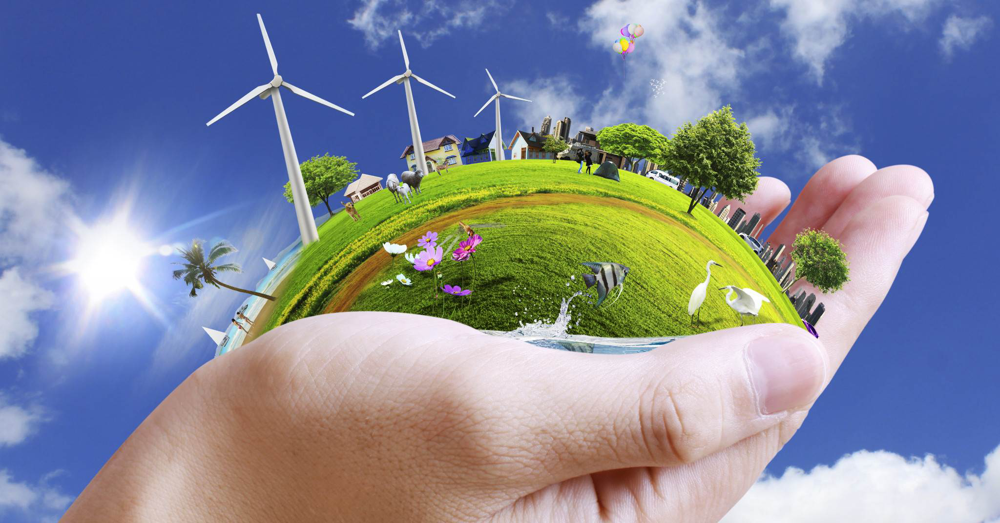

In [30]:
template
